In [17]:
import os
import sys
import warnings

import numpy as np
import pandas as pd
import scipy as sc
import scipy.stats as stats
from scipy.signal import find_peaks
from sklearn.metrics import r2_score

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.style as mplstyle

sys.path.append('/Users/kjesta/Desktop/LABDATA/')
sys.path.append('/Users/kjesta/Desktop/Master prosjekt/Master_code/Lab/')
sys.path.append('/Users/kjesta/Desktop/Master prosjekt/Processed_files/')

from funcs import *
from processing_funcs import *
from analysis_funcs import *
from open_data import *

mplstyle.use(["ggplot", "fast"])

warnings.filterwarnings("ignore")

%load_ext autoreload
%autoreload 2

# For plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.style as mplstyle
mplstyle.use(['ggplot', 'fast'])

mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['font.size'] = 12
mpl.rcParams['axes.titlesize'] = 14
mpl.rcParams['axes.labelsize'] = 12
mpl.rcParams['xtick.labelsize'] = 12
mpl.rcParams['ytick.labelsize'] = 12

from matplotlib.transforms import ScaledTranslation
from matplotlib.colors import LinearSegmentedColormap
from cmocean import cm as cmo
from matplotlib.lines import Line2D
from matplotlib.colors import Normalize
from matplotlib.ticker import FuncFormatter

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [18]:
data20 = processed_data_20cm
data30 = processed_data_30cm

In [19]:
freqs20 = list(data20.keys())
volts20 = []

for i in range(len(freqs20)):
    volts20.append(list(data20[freqs20[i]].keys()))

In [20]:
freqs30 = list(data30.keys())
volts30 = []

for i in range(len(freqs30)):
    volts30.append(list(data30[freqs30[i]].keys()))

# 20 cm - no plates

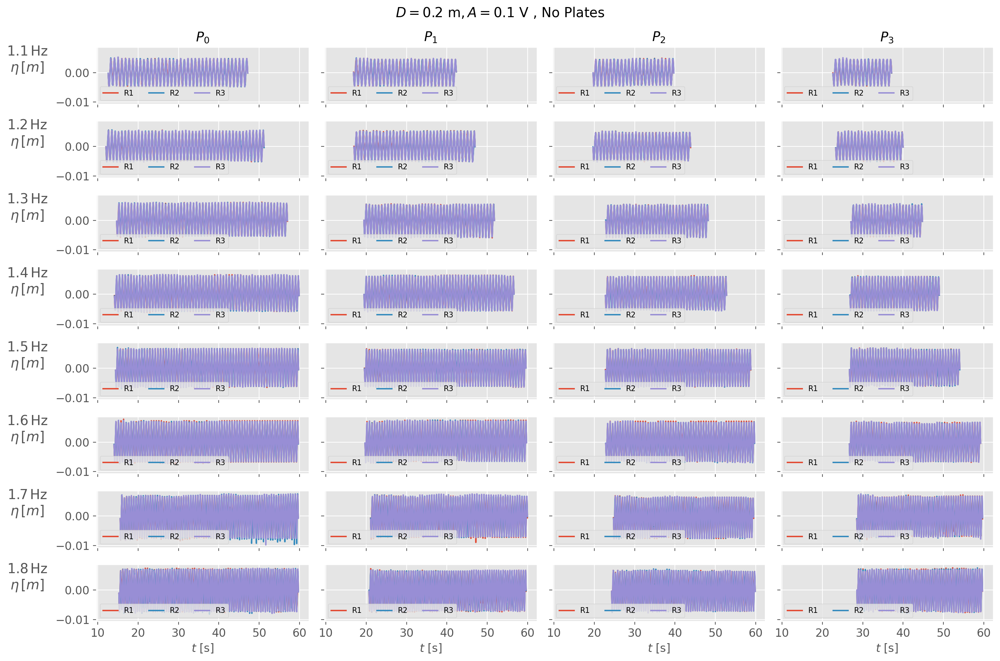

In [21]:
fig, ax = plt.subplots(len(freqs20), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs20):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data20[f][volts20[i][0]]["None"]["R1"]["time"],
                  data20[f][volts20[i][0]]["None"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data20[f][volts20[i][0]]["None"]["R2"]["time"],
                  data20[f][volts20[i][0]]["None"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data20[f][volts20[i][0]]["None"]["R3"]["time"],
                  data20[f][volts20[i][0]]["None"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data20[f][volts20[i][0]]["None"]["R1"]["time"],
                  data20[f][volts20[i][0]]["None"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data20[f][volts20[i][0]]["None"]["R2"]["time"],
                  data20[f][volts20[i][0]]["None"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data20[f][volts20[i][0]]["None"]["R3"]["time"],
                  data20[f][volts20[i][0]]["None"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data20[f][volts20[i][0]]["None"]["R1"]["time"],
                  data20[f][volts20[i][0]]["None"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data20[f][volts20[i][0]]["None"]["R2"]["time"],
                  data20[f][volts20[i][0]]["None"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data20[f][volts20[i][0]]["None"]["R3"]["time"],
                  data20[f][volts20[i][0]]["None"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data20[f][volts20[i][0]]["None"]["R1"]["time"],
                  data20[f][volts20[i][0]]["None"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data20[f][volts20[i][0]]["None"]["R2"]["time"],
                  data20[f][volts20[i][0]]["None"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data20[f][volts20[i][0]]["None"]["R3"]["time"],
                  data20[f][volts20[i][0]]["None"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='lower left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs20]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)

# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.2\ \text{m}, A = 0.1\ \text{V}\ $, No Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/20cm_a01_no_plates.png', dpi=200)

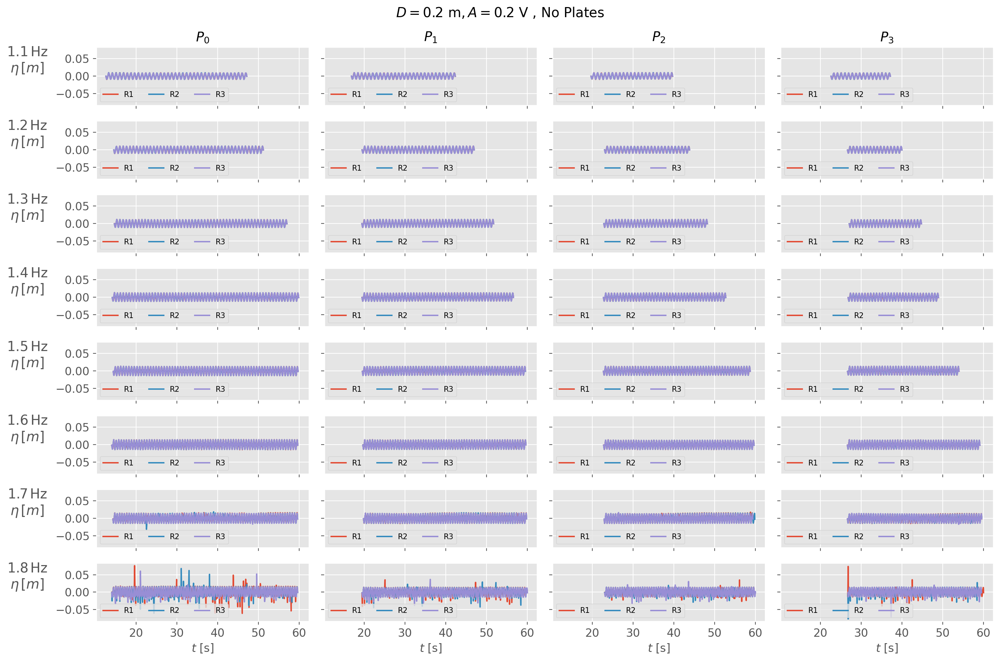

In [22]:
fig, ax = plt.subplots(len(freqs20), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs20):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data20[f][volts20[i][1]]["None"]["R1"]["time"],
                  data20[f][volts20[i][1]]["None"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data20[f][volts20[i][1]]["None"]["R2"]["time"],
                  data20[f][volts20[i][1]]["None"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data20[f][volts20[i][1]]["None"]["R3"]["time"],
                  data20[f][volts20[i][1]]["None"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data20[f][volts20[i][1]]["None"]["R1"]["time"],
                  data20[f][volts20[i][1]]["None"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data20[f][volts20[i][1]]["None"]["R2"]["time"],
                  data20[f][volts20[i][1]]["None"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data20[f][volts20[i][1]]["None"]["R3"]["time"],
                  data20[f][volts20[i][1]]["None"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data20[f][volts20[i][1]]["None"]["R1"]["time"],
                  data20[f][volts20[i][1]]["None"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data20[f][volts20[i][1]]["None"]["R2"]["time"],
                  data20[f][volts20[i][1]]["None"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data20[f][volts20[i][1]]["None"]["R3"]["time"],
                  data20[f][volts20[i][1]]["None"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data20[f][volts20[i][1]]["None"]["R1"]["time"],
                  data20[f][volts20[i][1]]["None"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data20[f][volts20[i][1]]["None"]["R2"]["time"],
                  data20[f][volts20[i][1]]["None"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data20[f][volts20[i][1]]["None"]["R3"]["time"],
                  data20[f][volts20[i][1]]["None"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='lower left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs20]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)
# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.2\ \text{m}, A = 0.2\ \text{V}\ $, No Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/20cm_a02_no_plates.png', dpi=200)

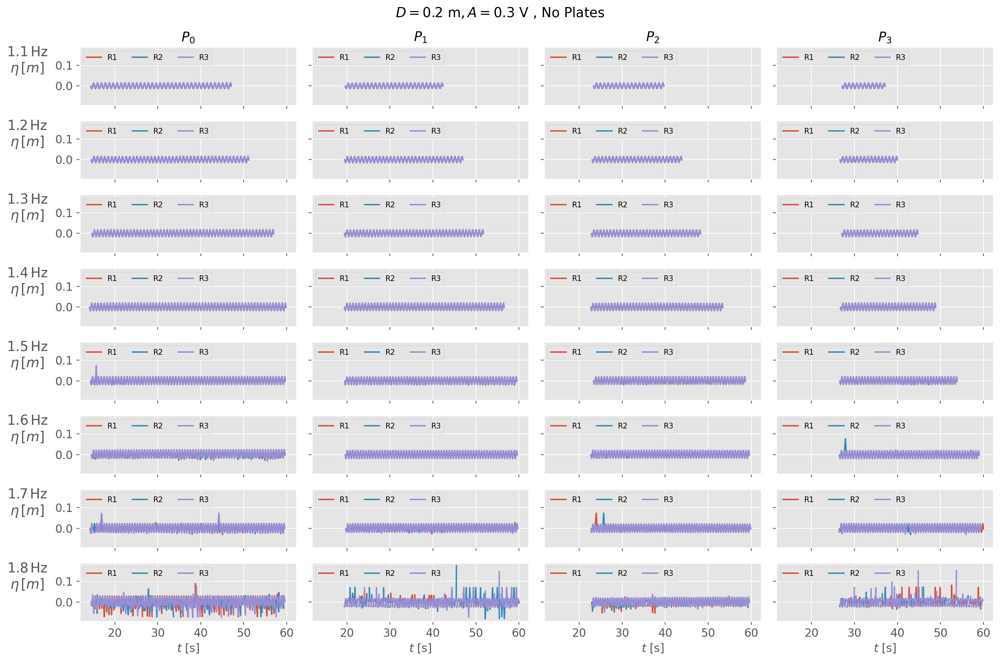

In [23]:
fig, ax = plt.subplots(len(freqs20), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs20):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data20[f][volts20[i][-1]]["None"]["R1"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data20[f][volts20[i][-1]]["None"]["R2"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data20[f][volts20[i][-1]]["None"]["R3"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data20[f][volts20[i][-1]]["None"]["R1"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data20[f][volts20[i][-1]]["None"]["R2"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data20[f][volts20[i][-1]]["None"]["R3"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data20[f][volts20[i][-1]]["None"]["R1"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data20[f][volts20[i][-1]]["None"]["R2"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data20[f][volts20[i][-1]]["None"]["R3"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data20[f][volts20[i][-1]]["None"]["R1"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data20[f][volts20[i][-1]]["None"]["R2"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data20[f][volts20[i][-1]]["None"]["R3"]["time"],
                  data20[f][volts20[i][-1]]["None"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='upper left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs20]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)
# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.2\ \text{m}, A = 0.3\ \text{V}\ $, No Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/20cm_a03_no_plates.png', dpi=200)

# 20 cm - plates

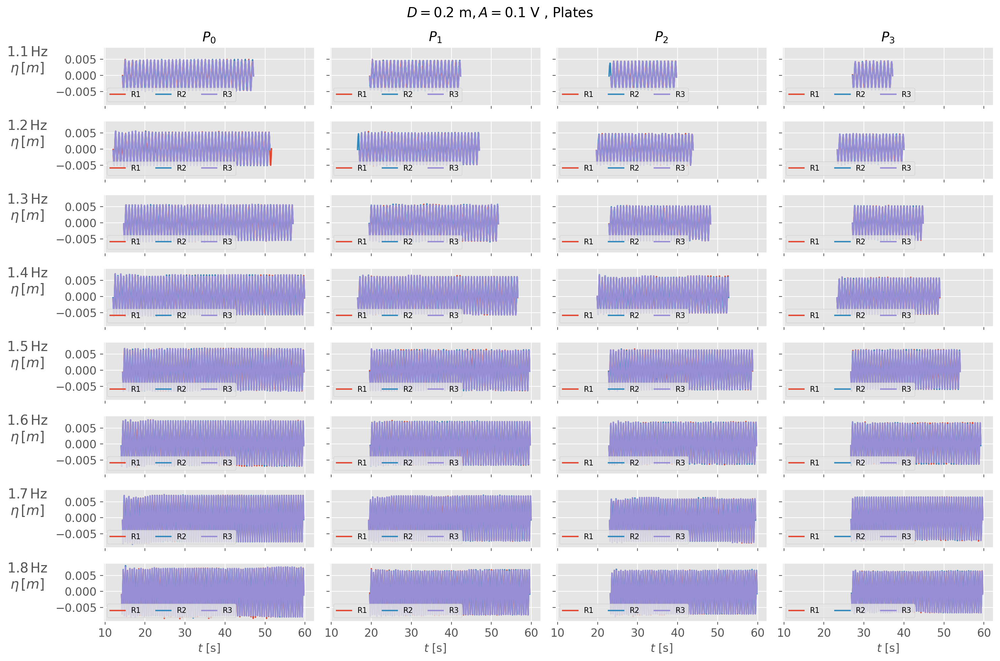

In [24]:
fig, ax = plt.subplots(len(freqs20), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs20):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data20[f][volts20[i][0]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data20[f][volts20[i][0]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data20[f][volts20[i][0]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data20[f][volts20[i][0]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data20[f][volts20[i][0]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data20[f][volts20[i][0]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data20[f][volts20[i][0]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data20[f][volts20[i][0]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data20[f][volts20[i][0]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data20[f][volts20[i][0]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data20[f][volts20[i][0]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data20[f][volts20[i][0]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][0]]["p005"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='lower left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs20]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)

# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.2\ \text{m}, A = 0.1\ \text{V}\ $, Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/20cm_a01_plates.png', dpi=200)

In [ ]:
fig, ax = plt.subplots(len(freqs20), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs20):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data20[f][volts20[i][1]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data20[f][volts20[i][1]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data20[f][volts20[i][1]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data20[f][volts20[i][1]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data20[f][volts20[i][1]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data20[f][volts20[i][1]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data20[f][volts20[i][1]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data20[f][volts20[i][1]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data20[f][volts20[i][1]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data20[f][volts20[i][1]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data20[f][volts20[i][1]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data20[f][volts20[i][1]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][1]]["p005"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='lower left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs20]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)

# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.2\ \text{m}, A = 0.2\ \text{V}\ $, Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/20cm_a02_plates.png', dpi=200)

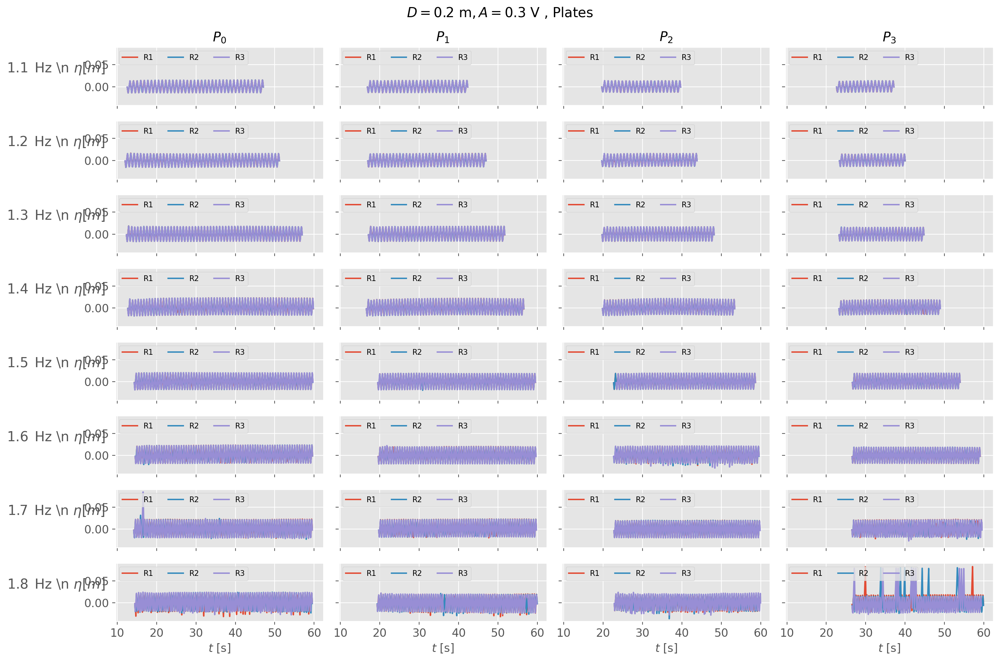

In [ ]:
fig, ax = plt.subplots(len(freqs20), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs20):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data20[f][volts20[i][-1]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data20[f][volts20[i][-1]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data20[f][volts20[i][-1]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data20[f][volts20[i][-1]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data20[f][volts20[i][-1]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data20[f][volts20[i][-1]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data20[f][volts20[i][-1]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data20[f][volts20[i][-1]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data20[f][volts20[i][-1]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data20[f][volts20[i][-1]]["p005"]["R1"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data20[f][volts20[i][-1]]["p005"]["R2"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data20[f][volts20[i][-1]]["p005"]["R3"]["time"],
                  data20[f][volts20[i][-1]]["p005"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='upper left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs20]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)

# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.2\ \text{m}, A = 0.3\ \text{V}\ $, Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/20cm_a03_plates.png', dpi=200)

# 30 cm - no plates

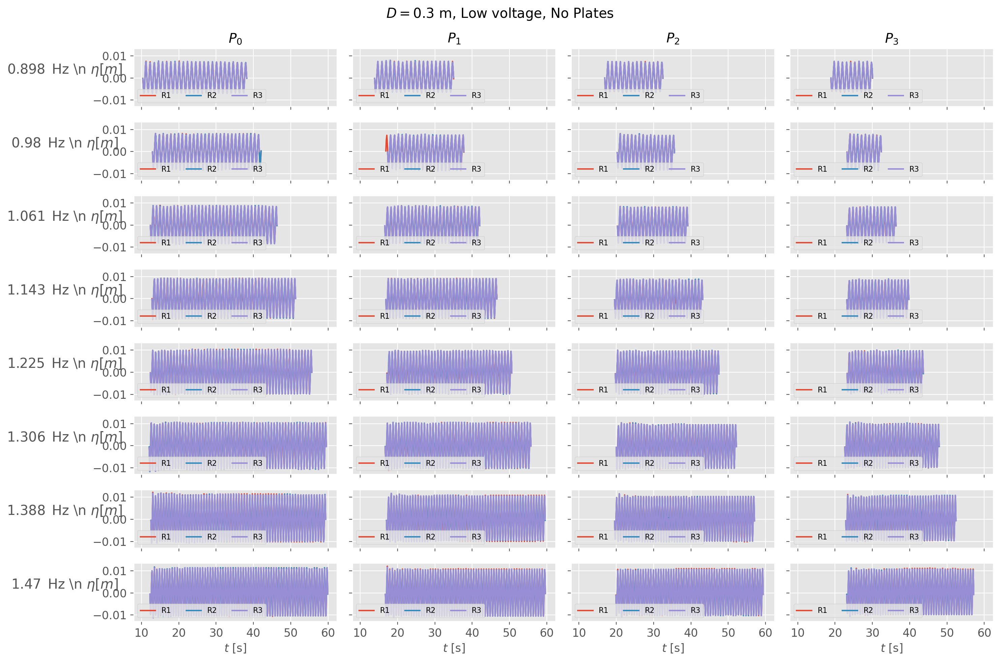

In [ ]:
fig, ax = plt.subplots(len(freqs30), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs30):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data30[f][volts30[i][0]]["None"]["R1"]["time"],
                  data30[f][volts30[i][0]]["None"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data30[f][volts30[i][0]]["None"]["R2"]["time"],
                  data30[f][volts30[i][0]]["None"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data30[f][volts30[i][0]]["None"]["R3"]["time"],
                  data30[f][volts30[i][0]]["None"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data30[f][volts30[i][0]]["None"]["R1"]["time"],
                  data30[f][volts30[i][0]]["None"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data30[f][volts30[i][0]]["None"]["R2"]["time"],
                  data30[f][volts30[i][0]]["None"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data30[f][volts30[i][0]]["None"]["R3"]["time"],
                  data30[f][volts30[i][0]]["None"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data30[f][volts30[i][0]]["None"]["R1"]["time"],
                  data30[f][volts30[i][0]]["None"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data30[f][volts30[i][0]]["None"]["R2"]["time"],
                  data30[f][volts30[i][0]]["None"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data30[f][volts30[i][0]]["None"]["R3"]["time"],
                  data30[f][volts30[i][0]]["None"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data30[f][volts30[i][0]]["None"]["R1"]["time"],
                  data30[f][volts30[i][0]]["None"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data30[f][volts30[i][0]]["None"]["R2"]["time"],
                  data30[f][volts30[i][0]]["None"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data30[f][volts30[i][0]]["None"]["R3"]["time"],
                  data30[f][volts30[i][0]]["None"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='lower left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs30]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)

# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.3\ \text{m}$, Low voltage, No Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/30cm_alow_no_plates.png', dpi=200)

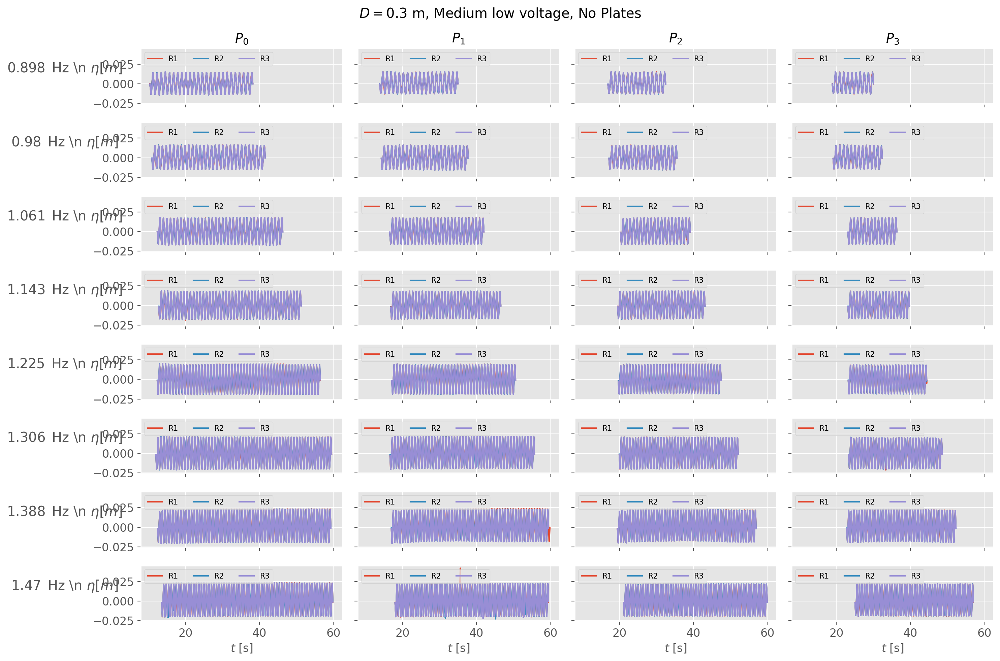

In [ ]:
fig, ax = plt.subplots(len(freqs30), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs30):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data30[f][volts30[i][1]]["None"]["R1"]["time"],
                  data30[f][volts30[i][1]]["None"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data30[f][volts30[i][1]]["None"]["R2"]["time"],
                  data30[f][volts30[i][1]]["None"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data30[f][volts30[i][1]]["None"]["R3"]["time"],
                  data30[f][volts30[i][1]]["None"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data30[f][volts30[i][1]]["None"]["R1"]["time"],
                  data30[f][volts30[i][1]]["None"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data30[f][volts30[i][1]]["None"]["R2"]["time"],
                  data30[f][volts30[i][1]]["None"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data30[f][volts30[i][1]]["None"]["R3"]["time"],
                  data30[f][volts30[i][1]]["None"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data30[f][volts30[i][1]]["None"]["R1"]["time"],
                  data30[f][volts30[i][1]]["None"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data30[f][volts30[i][1]]["None"]["R2"]["time"],
                  data30[f][volts30[i][1]]["None"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data30[f][volts30[i][1]]["None"]["R3"]["time"],
                  data30[f][volts30[i][1]]["None"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data30[f][volts30[i][1]]["None"]["R1"]["time"],
                  data30[f][volts30[i][1]]["None"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data30[f][volts30[i][1]]["None"]["R2"]["time"],
                  data30[f][volts30[i][1]]["None"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data30[f][volts30[i][1]]["None"]["R3"]["time"],
                  data30[f][volts30[i][1]]["None"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='upper left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs30]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)

# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.3\ \text{m}$, Medium low voltage, No Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/30cm_amedlow_no_plates.png', dpi=200)

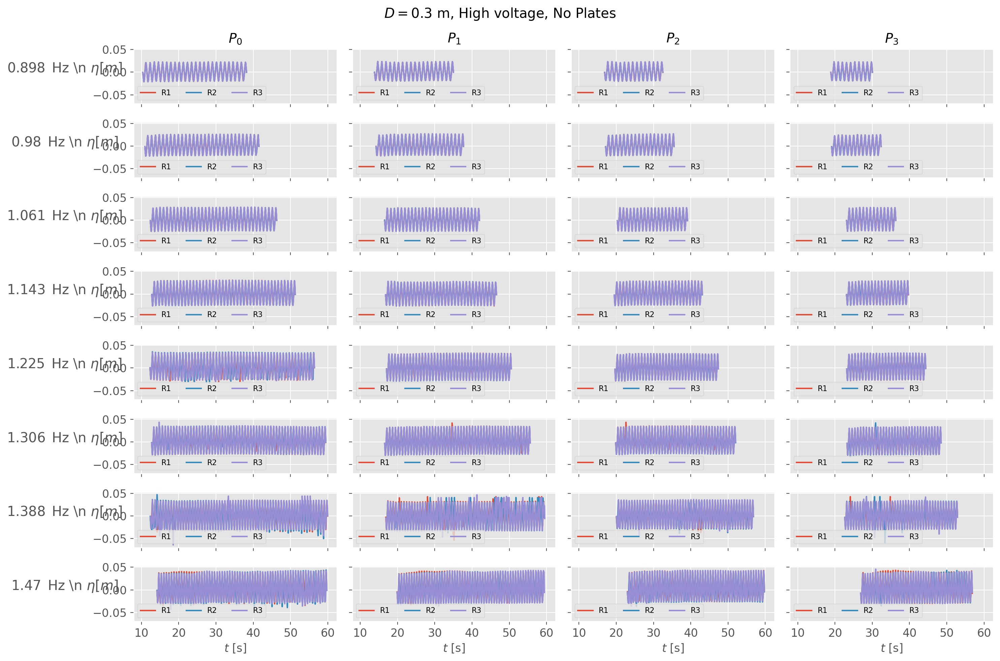

In [ ]:
fig, ax = plt.subplots(len(freqs30), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs30):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data30[f][volts30[i][-1]]["None"]["R1"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data30[f][volts30[i][-1]]["None"]["R2"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data30[f][volts30[i][-1]]["None"]["R3"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data30[f][volts30[i][-1]]["None"]["R1"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data30[f][volts30[i][-1]]["None"]["R2"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data30[f][volts30[i][-1]]["None"]["R3"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data30[f][volts30[i][-1]]["None"]["R1"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data30[f][volts30[i][-1]]["None"]["R2"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data30[f][volts30[i][-1]]["None"]["R3"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data30[f][volts30[i][-1]]["None"]["R1"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data30[f][volts30[i][-1]]["None"]["R2"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data30[f][volts30[i][-1]]["None"]["R3"]["time"],
                  data30[f][volts30[i][-1]]["None"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='lower left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs30]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)

# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.3\ \text{m}$, High voltage, No Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/30cm_ahigh_no_plates.png', dpi=200)

# 30 cm - plates

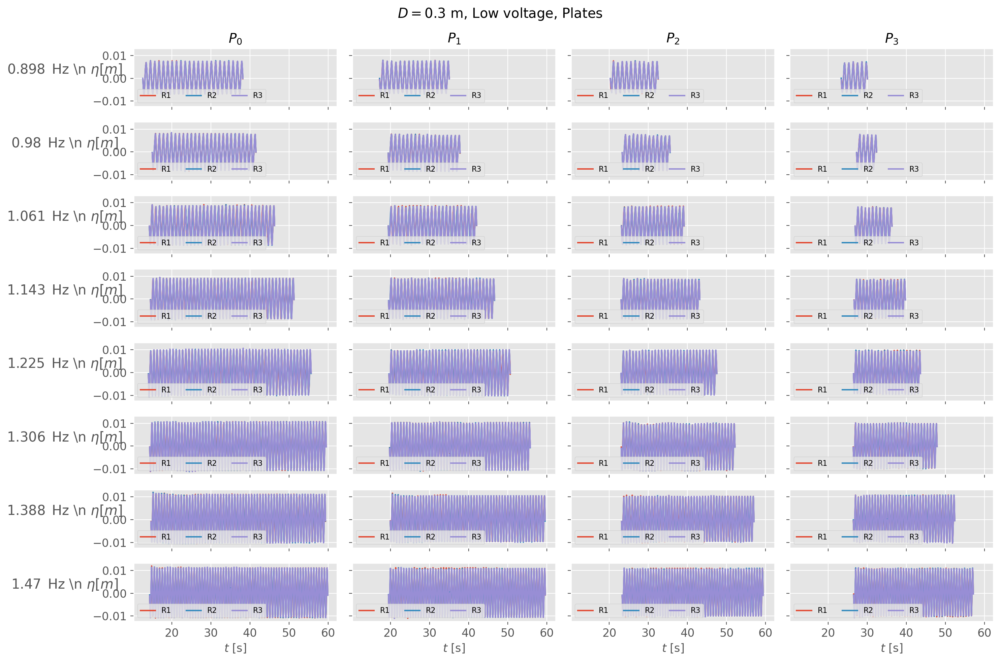

In [ ]:
fig, ax = plt.subplots(len(freqs30), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs30):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data30[f][volts30[i][0]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data30[f][volts30[i][0]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data30[f][volts30[i][0]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data30[f][volts30[i][0]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data30[f][volts30[i][0]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data30[f][volts30[i][0]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data30[f][volts30[i][0]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data30[f][volts30[i][0]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data30[f][volts30[i][0]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data30[f][volts30[i][0]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data30[f][volts30[i][0]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data30[f][volts30[i][0]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][0]]["p005"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='lower left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs30]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)

# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.3\ \text{m}$, Low voltage, Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/30cm_alow_plates.png', dpi=200)

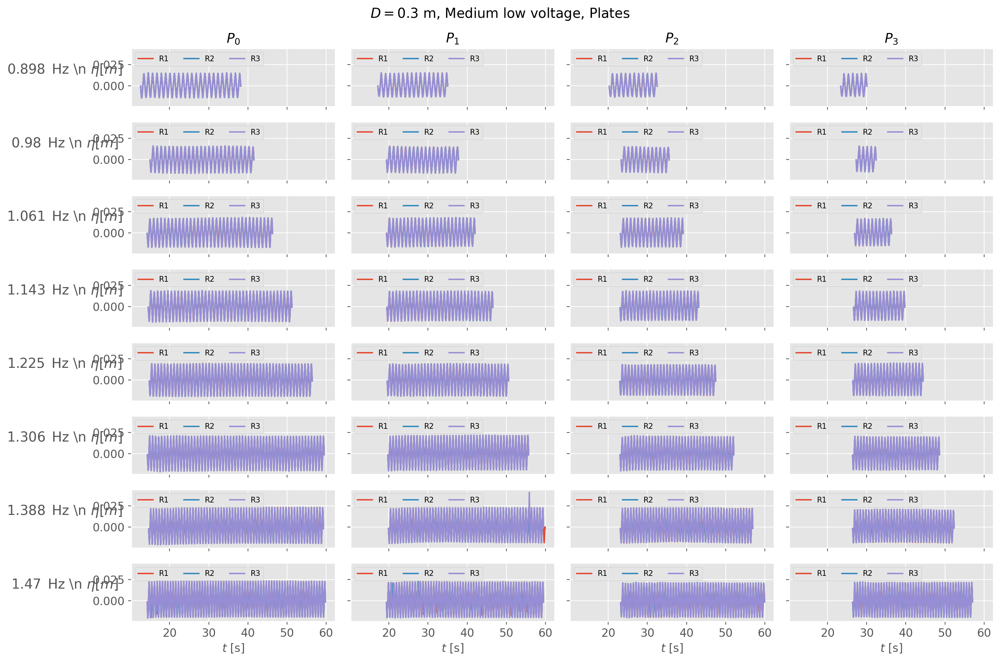

In [ ]:
fig, ax = plt.subplots(len(freqs30), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs30):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data30[f][volts30[i][1]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data30[f][volts30[i][1]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data30[f][volts30[i][1]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data30[f][volts30[i][1]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data30[f][volts30[i][1]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data30[f][volts30[i][1]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data30[f][volts30[i][1]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data30[f][volts30[i][1]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data30[f][volts30[i][1]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data30[f][volts30[i][1]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data30[f][volts30[i][1]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data30[f][volts30[i][1]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][1]]["p005"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='upper left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs30]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)

# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.3\ \text{m}$, Medium low voltage, Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/30cm_amedlow_plates.png', dpi=200)

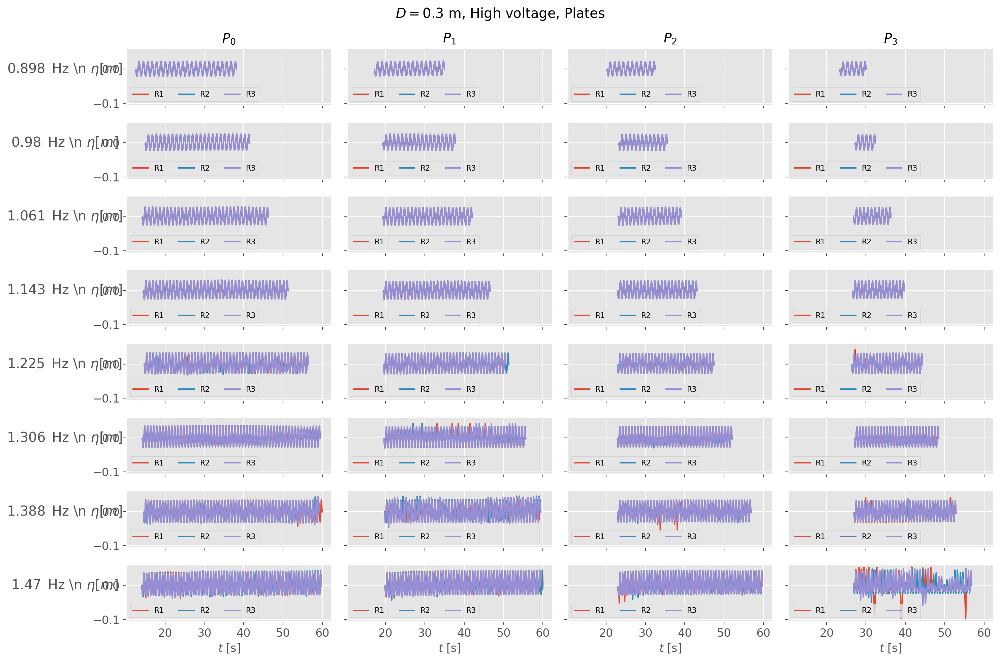

In [ ]:
fig, ax = plt.subplots(len(freqs30), 4, figsize=(15, 10), sharex=True, sharey=True)

for i, f in enumerate(freqs30):
    k = estimate_wavenumber(f, 0.2)
        
    ax[i, 0].plot(data30[f][volts30[i][-1]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R1"]["P_0"] * (-1),
                  color='C0', label='R1')
    ax[i, 0].plot(data30[f][volts30[i][-1]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R2"]["P_0"] * (-1),
                  color='C1', label='R2')
    ax[i, 0].plot(data30[f][volts30[i][-1]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R3"]["P_0"] * (-1),
                  color='C2', label='R3')

    ax[i, 1].plot(data30[f][volts30[i][-1]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R1"]["P_1"] * (-1),
                  color='C0', label='R1')
    ax[i, 1].plot(data30[f][volts30[i][-1]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R2"]["P_1"] * (-1),
                  color='C1', label='R2')
    ax[i, 1].plot(data30[f][volts30[i][-1]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R3"]["P_1"] * (-1),
                  color='C2', label='R3')

    ax[i, 2].plot(data30[f][volts30[i][-1]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R1"]["P_2"] * (-1),
                  color='C0', label='R1')
    ax[i, 2].plot(data30[f][volts30[i][-1]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R2"]["P_2"] * (-1),
                  color='C1', label='R2')
    ax[i, 2].plot(data30[f][volts30[i][-1]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R3"]["P_2"] * (-1),
                  color='C2', label='R3')

    ax[i, 3].plot(data30[f][volts30[i][-1]]["p005"]["R1"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R1"]["P_3"] * (-1),
                  color='C0', label='R1')
    ax[i, 3].plot(data30[f][volts30[i][-1]]["p005"]["R2"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R2"]["P_3"] * (-1),
                  color='C1', label='R2')
    ax[i, 3].plot(data30[f][volts30[i][-1]]["p005"]["R3"]["time"],
                  data30[f][volts30[i][-1]]["p005"]["R3"]["P_3"] * (-1),
                  color='C2', label='R3')
    
for a in ax.flatten():
    a.legend(loc='lower left', ncol=3, fontsize=8)

# Column titles: P_0 to P_3
cols = [r'$P_0$', r'$P_1$', r'$P_2$', r'$P_3$']

# Row titles: frequencies
rows = [f'${f}\\,\\text{{Hz}}$\n$\\eta\\,[m]$' for f in freqs30]

for axis, col in zip(ax[0], cols):
    axis.set_title(col)

for axis, row in zip(ax[:, 0], rows):
    axis.set_ylabel(row, rotation=0, size='large', labelpad=30)

# X-labels only for last row
for axis in ax[-1, :]:
    axis.set_xlabel(r'$t\ \text{[s]}$')

fig.suptitle(r'$D = 0.3\ \text{m}$, High voltage, Plates')
plt.tight_layout()
plt.savefig('/Users/kjesta/Desktop/Master prosjekt/Figurer/processed_data/30cm_ahigh_plates.png', dpi=200)